<a href="https://colab.research.google.com/github/barbozasjulia/analise-educacao-brasil-case-bd/blob/main/case_bd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center> Análise da Qualidade do Ensino e do Acesso à Internet </center> 
# <center> nas Escolas do Brasil </center> 
___

# Introdução

A estudo tem como principal objetivo analisar a qualidade do ensino e do acesso à internet das escolas no Brasil através da Análise Exploratória e Visualização dos Dados. Para isso, utilizou-se um diretório e duas tabelas com dados tratados da Base dos Dados (BD+):

• Tabela de Diretório ['municipio'](https://basedosdados.org/dataset/br-bd-diretorios-brasil?bdm_table=municipio) do BD+ Diretórios Brasileiros

• Tabela ['escola'](https://basedosdados.org/dataset/br-inep-ideb?bdm_table=escola) do BD+ Índice de Desenvolvimento da Educação Básica (Ideb)

• Tabela ['pble'](https://basedosdados.org/dataset/br-anatel-banda-larga-fixa?bdm_table=pble) do BD+ Acessos de banda larga fixa no Brasil

## Índice de Desenvolvimento da Educação Básica (Ideb):

O Ideb reúne, em um só indicador, os resultados de dois conceitos igualmente importantes para a qualidade da educação: o Indicador de Desempenho e a Nota do Sistema de Avaliação da Educação Básica (Saeb). Dessa forma, o indicador Ideb, o Indicador de Desempenho e a Nota do Saeb serão as 3 principais métricas de análise desse dataset.

## Programa Banda Larga nas Escolas (PBLE):

O PBLE traz os dados da implementação de internet banda larga nas escolas. Nesse dataset, serão eplorados, principalmente, dados categóricos.

## Pipeline:

Focando na otimização e produtividade, o processo será dividido em 5 etapas: Importação de Pacotes e Bibliotecas, Importação de Dados, Análise do DataFrame, Preparação dos Dados e Análise Exploratória e Visualização de Dados.





___

# 1. Importação de Pacotes e Bibliotecas

In [1]:
!pip install basedosdados==1.6.5-b4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 50 kB 5.1 MB/s 
     |████████████████████████████████| 270 kB 16.3 MB/s 
     |████████████████████████████████| 203 kB 74.1 MB/s 
     |████████████████████████████████| 105 kB 74.5 MB/s 
     |████████████████████████████████| 9.9 MB 68.9 MB/s 
     |████████████████████████████████| 108 kB 70.8 MB/s 
     |████████████████████████████████| 70 kB 10.1 MB/s 
     |████████████████████████████████| 25.5 MB 1.1 MB/s 
     |████████████████████████████████| 3.7 MB 48.8 MB/s 
     |████████████████████████████████| 135 kB 54.1 MB/s 
     |████████████████████████████████| 58 kB 7.4 MB/s 
     |████████████████████████████████| 97 kB 2.0 MB/s 
     |████████████████████████████████| 1.1 MB 66.9 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |██████████████████████

In [2]:
import basedosdados as bd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

%matplotlib inline

# 2. Importação de  Dados

#### Importação dos datasets e do diretório da Base dos Dados utilizando query SQL a fim de otimizar a carga dos dados.

In [3]:
# Dados do Ideb com Diretório de Municípios
df_ideb = bd.read_sql('''SELECT ideb.ano, dir.nome_regiao, dir.sigla_uf, dir.nome_uf, ideb.id_municipio, dir.nome, 
                        ideb.id_escola, ideb.rede, ideb.ensino, 
                        ideb.indicador_rendimento, ideb.nota_saeb_media_padronizada, ideb.ideb
                        FROM `basedosdados.br_inep_ideb.escola` AS ideb
                        LEFT JOIN `basedosdados.br_bd_diretorios_brasil.municipio` AS dir
                        ON ideb.id_municipio = dir.id_municipio
                        WHERE ideb.ano BETWEEN 2007 AND 2019''', 
                        billing_project_id='basedosdados-360020')

Downloading: 100%|██████████| 792481/792481 [00:53<00:00, 14738.47rows/s]


In [4]:
# Dados do PBLE
df_pble = bd.read_sql('''SELECT pble.ano, pble.mes, pble.dia, 
                        dir.nome_regiao, dir.sigla_uf, dir.nome_uf, pble.id_municipio, dir.nome, 
                        pble.rede, pble.id_escola 
                        FROM `basedosdados.br_anatel_banda_larga_fixa.pble` AS pble
                        LEFT JOIN `basedosdados.br_bd_diretorios_brasil.municipio` AS dir
                        ON pble.id_municipio = dir.id_municipio
                        WHERE pble.ano BETWEEN 2007 AND 2019''', 
                        billing_project_id='basedosdados-360020')

Downloading: 100%|██████████| 65017/65017 [00:03<00:00, 17747.08rows/s]


# 3. Análise do DataFrame (DF)
#### Etapa para analisar o que pode estar fora do padrão para posterior tratamento.

## 3.1 Conhecendo a Base do Ideb

In [5]:
# Observar as primeiras linhas do DF (5 por padrão)
df_ideb.head()

,ano,nome_regiao,sigla_uf,nome_uf,id_municipio,nome,id_escola,rede,ensino,indicador_rendimento,nota_saeb_media_padronizada,ideb
0,2007,Norte,AC,Acre,1200013,Acrelândia,12008966,municipal,fundamental,NaN,NaN,NaN
1,2007,Norte,AC,Acre,1200013,Acrelândia,12008966,municipal,fundamental,NaN,NaN,NaN
2,2007,Norte,AC,Acre,1200013,Acrelândia,12009156,municipal,fundamental,NaN,NaN,NaN
3,2007,Norte,AC,Acre,1200013,Acrelândia,12009156,municipal,fundamental,NaN,NaN,NaN
4,2007,Norte,AC,Acre,1200013,Acrelândia,12009164,estadual,fundamental,NaN,NaN,NaN


In [6]:
# Observar as últimas linhas do DF (5 por padrão)
df_ideb.tail()

,ano,nome_regiao,sigla_uf,nome_uf,id_municipio,nome,id_escola,rede,ensino,indicador_rendimento,nota_saeb_media_padronizada,ideb
792476,2019,Norte,TO,Tocantins,1722107,Xambioá,17010462,estadual,fundamental,0.803303,NaN,NaN
792477,2019,Norte,TO,Tocantins,1722107,Xambioá,17010462,estadual,fundamental,NaN,NaN,NaN
792478,2019,Norte,TO,Tocantins,1722107,Xambioá,17010462,estadual,medio,NaN,NaN,NaN
792479,2019,Norte,TO,Tocantins,1722107,Xambioá,17010519,municipal,fundamental,0.938214,4.431424,4.2
792480,2019,Norte,TO,Tocantins,1722107,Xambioá,17044790,municipal,fundamental,0.992374,4.652042,4.6


In [7]:
# Observar 5 linhas aleatórias do DF
df_ideb.sample(5)

,ano,nome_regiao,sigla_uf,nome_uf,id_municipio,nome,id_escola,rede,ensino,indicador_rendimento,nota_saeb_media_padronizada,ideb
763616,2019,Sul,RS,Rio Grande do Sul,4314902,Porto Alegre,43106498,estadual,medio,0.839205,5.233973,4.4
295911,2011,Sul,RS,Rio Grande do Sul,4304804,Carlos Barbosa,43040365,municipal,fundamental,0.801276,5.683167,4.6
27688,2007,Centro-Oeste,GO,Goiás,5221403,Trindade,52039706,estadual,fundamental,0.922810,4.785336,4.4
399577,2013,Nordeste,RN,Rio Grande do Norte,2408300,Nova Cruz,24047066,municipal,fundamental,0.692006,2.939012,2.0
235867,2011,Nordeste,CE,Ceará,2312403,São Gonçalo do Amarante,23041463,municipal,fundamental,1.000000,4.051167,4.1


In [8]:
# Observar as informações do DF, como valores não nulos e se os tipos de dados (Dtype) estão de acordo
df_ideb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 792481 entries, 0 to 792480
Data columns (total 12 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   ano                          792481 non-null  Int64  
 1   nome_regiao                  792481 non-null  object 
 2   sigla_uf                     792481 non-null  object 
 3   nome_uf                      792481 non-null  object 
 4   id_municipio                 792481 non-null  object 
 5   nome                         792481 non-null  object 
 6   id_escola                    792481 non-null  object 
 7   rede                         792481 non-null  object 
 8   ensino                       792481 non-null  object 
 9   indicador_rendimento         572981 non-null  float64
 10  nota_saeb_media_padronizada  509881 non-null  float64
 11  ideb                         509707 non-null  float64
dtypes: Int64(1), float64(3), object(8)
memory usage: 73.3+ MB


In [9]:
# Observar a quantidade de linhas e colunas do DF
print(f'Quantidade de linhas do DataFrame: {df_ideb.shape[0]}')
print(f'Quantidade de colunas do Dataframe: {df_ideb.shape[1]}')

Quantidade de linhas do DataFrame: 792481
Quantidade de colunas do Dataframe: 12


In [10]:
# Observar algumas estatísticas das características (colunas) numéricas do DF
df_ideb.describe()

,ano,indicador_rendimento,nota_saeb_media_padronizada,ideb
count,792481.000000,572981.000000,509881.000000,509707.000000
mean,2013.260953,0.871811,5.093830,4.513688
std,4.056332,0.112394,0.947392,1.196128
min,2007.000000,0.013085,1.350903,0.100000
25%,2009.000000,0.812000,4.413151,3.600000
50%,2013.000000,0.900000,5.003388,4.400000
75%,2017.000000,0.959606,5.702160,5.300000
max,2019.000000,1.000000,9.907636,9.900000


In [11]:
# Verificar a presença de valores nulos no DF
df_ideb.isnull().sum()

ano                                 0
nome_regiao                         0
sigla_uf                            0
nome_uf                             0
id_municipio                        0
nome                                0
id_escola                           0
rede                                0
ensino                              0
indicador_rendimento           219500
nota_saeb_media_padronizada    282600
ideb                           282774
dtype: int64

## 3.2 Conhecendo a Base do PBLE

In [12]:
# Observar as primeiras linhas do DF (5 por padrão)
df_pble.head()

,ano,mes,dia,nome_regiao,sigla_uf,nome_uf,id_municipio,nome,rede,id_escola
0,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Municipal,RO01032131
1,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Municipal,11007451
2,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Estadual,11007885
3,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Estadual,11007893
4,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Estadual,11006889


In [13]:
# Observar as últimas linhas do DF (5 por padrão)
df_pble.tail()

,ano,mes,dia,nome_regiao,sigla_uf,nome_uf,id_municipio,nome,rede,id_escola
65012,2019,6,10,Centro-Oeste,DF,Distrito Federal,5300108,Brasília,Estadual,53017412
65013,2019,3,8,Centro-Oeste,DF,Distrito Federal,5300108,Brasília,Federal,53016645
65014,2019,6,27,Centro-Oeste,DF,Distrito Federal,5300108,Brasília,Estadual,53016793
65015,2019,11,22,Centro-Oeste,DF,Distrito Federal,5300108,Brasília,Estadual,53017498
65016,2019,12,9,Centro-Oeste,DF,Distrito Federal,5300108,Brasília,Estadual,53017234


In [14]:
# Observar 5 linhas aleatórias do DF
df_pble.sample(5)

,ano,mes,dia,nome_regiao,sigla_uf,nome_uf,id_municipio,nome,rede,id_escola
50472,2010,1,1,Sul,RS,Rio Grande do Sul,4320800,Soledade,Estadual,43171087
18906,2008,12,30,Sul,RS,Rio Grande do Sul,4321204,Taquara,Estadual,43152767
40422,2009,12,30,Centro-Oeste,GO,Goiás,5219308,Santa Helena de Goiás,Municipal,52055566
50348,2010,12,1,Sul,RS,Rio Grande do Sul,4316808,Santa Cruz do Sul,Municipal,RS01067199
21049,2009,12,30,Norte,AC,Acre,1200401,Rio Branco,Estadual,12027758


In [15]:
# Observar as informações do DF, como valores não nulos e se os tipos de dados (Dtype) estão de acordo
df_pble.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65017 entries, 0 to 65016
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   ano           65017 non-null  Int64 
 1   mes           65017 non-null  Int64 
 2   dia           65017 non-null  Int64 
 3   nome_regiao   65017 non-null  object
 4   sigla_uf      65017 non-null  object
 5   nome_uf       65017 non-null  object
 6   id_municipio  65017 non-null  object
 7   nome          65017 non-null  object
 8   rede          65017 non-null  object
 9   id_escola     65017 non-null  object
dtypes: Int64(3), object(7)
memory usage: 5.1+ MB


In [16]:
# Observar a quantidade de linhas e colunas do DF
print(f'Quantidade de linhas do DataFrame: {df_pble.shape[0]}')
print(f'Quantidade de colunas do Dataframe: {df_pble.shape[1]}')

Quantidade de linhas do DataFrame: 65017
Quantidade de colunas do Dataframe: 10


In [17]:
# Observar algumas estatísticas das características (colunas) numéricas do DF
df_pble.describe()

,ano,mes,dia
count,65017.000000,65017.000000,65017.000000
mean,2009.838288,9.210099,16.016949
std,2.463795,3.426921,13.473333
min,2008.000000,1.000000,1.000000
25%,2008.000000,6.000000,1.000000
50%,2009.000000,12.000000,18.000000
75%,2010.000000,12.000000,30.000000
max,2019.000000,12.000000,31.000000


In [18]:
# Verificar a presença de valores nulos por coluna no DF
df_pble.isnull().sum()

ano             0
mes             0
dia             0
nome_regiao     0
sigla_uf        0
nome_uf         0
id_municipio    0
nome            0
rede            0
id_escola       0
dtype: int64

# 4. Preparação dos Dados

#### Etapa onde ocorre o tratamento dos dados, quando necessário, para uma posterior análise mais eficiente.

## 4.1 Tratamento da Base do Ideb

In [19]:
# Remover dados duplicados

print(f'Quantidade de linhas antes da remoção de Dados Duplicados: {df_ideb.shape[0]}')
df_ideb = df_ideb.drop_duplicates(keep="last")
print(f'Quantidade de linhas depois da remoção de Dados Duplicados: {df_ideb.shape[0]}')

Quantidade de linhas antes da remoção de Dados Duplicados: 792481
Quantidade de linhas depois da remoção de Dados Duplicados: 759379


In [20]:
# Remover dados ausentes passado como parâmetro a coluna 'ideb', já que é a principal métrica utilizada
df_ideb = df_ideb.dropna(subset=['ideb']).reset_index(drop=True)
df_ideb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 509707 entries, 0 to 509706
Data columns (total 12 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   ano                          509707 non-null  Int64  
 1   nome_regiao                  509707 non-null  object 
 2   sigla_uf                     509707 non-null  object 
 3   nome_uf                      509707 non-null  object 
 4   id_municipio                 509707 non-null  object 
 5   nome                         509707 non-null  object 
 6   id_escola                    509707 non-null  object 
 7   rede                         509707 non-null  object 
 8   ensino                       509707 non-null  object 
 9   indicador_rendimento         509707 non-null  float64
 10  nota_saeb_media_padronizada  509707 non-null  float64
 11  ideb                         509707 non-null  float64
dtypes: Int64(1), float64(3), object(8)
memory usage: 47.2+ MB


## 4.2 Tratamento na Base do PBLE

In [21]:
# Criar serie (coluna) de data a partir das series de 'dia', 'mes' e 'ano'

df_pble['data'] = df_pble['dia'].map(str) + '-' + df_pble['mes'].map(str) + '-' + df_pble['ano'].map(str)
df_pble.head()

,ano,mes,dia,nome_regiao,sigla_uf,nome_uf,id_municipio,nome,rede,id_escola,data
0,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Municipal,RO01032131,30-12-2008
1,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Municipal,11007451,30-12-2008
2,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Estadual,11007885,30-12-2008
3,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Estadual,11007893,30-12-2008
4,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Estadual,11006889,30-12-2008


In [22]:
# Conversão de Dados: serie 'data' para 'datetime'
df_pble['data'] = pd.to_datetime(df_pble['data'], format='%d-%m-%Y')

In [23]:
# Dropando (excluindo) colunas 'mes' e 'dia'
df_pble.drop(['mes', 'dia'], axis=1)
df_pble.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65017 entries, 0 to 65016
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   ano           65017 non-null  Int64         
 1   mes           65017 non-null  Int64         
 2   dia           65017 non-null  Int64         
 3   nome_regiao   65017 non-null  object        
 4   sigla_uf      65017 non-null  object        
 5   nome_uf       65017 non-null  object        
 6   id_municipio  65017 non-null  object        
 7   nome          65017 non-null  object        
 8   rede          65017 non-null  object        
 9   id_escola     65017 non-null  object        
 10  data          65017 non-null  datetime64[ns]
dtypes: Int64(3), datetime64[ns](1), object(7)
memory usage: 5.6+ MB


In [24]:
# Remover dados duplicados

print(f'Quantidade de linhas antes da remoção de Dados Duplicados: {df_pble.shape[0]}')
df_pble = df_pble.drop_duplicates(keep="last")
print(f'Quantidade de linhas depois da remoção de Dados Duplicados: {df_pble.shape[0]}')

Quantidade de linhas antes da remoção de Dados Duplicados: 65017
Quantidade de linhas depois da remoção de Dados Duplicados: 65016


# 5. Análise Exploratória e Visualização de Dados

#### A Análise Exploratória dos Dados (AED) tem como objetivo utilizar técnicas Estatísticas e de Visualização de Dados para reunir insights, hipóteses e informações relevantes a partir da estruturação dos dados.  A AED e a Visualização geram valor à análise através de um entendimento mais profundo das variáveis que compõem a base de dados e as associações que existem entre elas.

#### Sendo assim, essa etapa irá trazer alguns insights e hipóteses com respectivas visualizações para um entendimento melhor dos dados.

## 5.1 Explorando a Base do Ideb

In [25]:
df_ideb.head()

,ano,nome_regiao,sigla_uf,nome_uf,id_municipio,nome,id_escola,rede,ensino,indicador_rendimento,nota_saeb_media_padronizada,ideb
0,2007,Norte,AC,Acre,1200013,Acrelândia,12009229,estadual,fundamental,0.851731,4.272000,3.6
1,2007,Norte,AC,Acre,1200013,Acrelândia,12009229,estadual,fundamental,0.845052,3.876843,3.3
2,2007,Norte,AC,Acre,1200013,Acrelândia,12023531,municipal,fundamental,0.740699,4.234166,3.1
3,2007,Norte,AC,Acre,1200054,Assis Brasil,12015873,municipal,fundamental,0.796179,3.793078,3.0
4,2007,Norte,AC,Acre,1200054,Assis Brasil,12015946,estadual,fundamental,0.775655,4.317333,3.3


## Distribuição dos Dados por Rede de Ensino

In [26]:
# Fazendo agrupamento e calculando as respectivas porcetagens
rede = df_ideb['rede'].value_counts().reset_index().rename(columns={'index': 'rede', 'rede': 'contagem'})
rede['porcentagem'] = (rede['contagem'] / rede['contagem'].sum())
rede.info()
rede.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   rede         4 non-null      object 
 1   contagem     4 non-null      int64  
 2   porcentagem  4 non-null      float64
dtypes: float64(1), int64(1), object(1)
memory usage: 224.0+ bytes


,rede,contagem,porcentagem
0,municipal,317174,0.622267
1,estadual,191039,0.374802
2,privada,853,0.001674
3,federal,641,0.001258


### Visualização:

In [27]:
fig = go.Figure(go.Bar(x = rede['rede'],
                       y=round(rede['porcentagem']*100, 2),
                       marker= {'color': np.arange(1,10)[::-1],
                                'colorscale': 'blues'}                       
                ))

fig.update_layout(
                title_text='Porcentagem por Rede de Ensino',
                title_font_size=20,
                bargap=0.2,
                width=500,
                height=800,
                template='gridon'
                )

fig.update_xaxes(title='Rede de Ensino', title_font_size=15, dtick = 1)
fig.update_yaxes(title='Porcentagem', title_font_size=15)

fig.show()

## Distribuição dos Dados por Região

### Visualização:

In [28]:
# Fazendo agrupamento com a contagem respectiva
regiao = df_ideb['nome_regiao'].value_counts().reset_index().rename(columns={'index': 'nome_regiao', 'nome_regiao': 'contagem'})

fig = go.Figure(go.Bar(x = regiao['nome_regiao'],
                       y=regiao['contagem'],
                       marker= {'color': np.arange(1,10)[::-1],
                                'colorscale': 'blues'}
                ))
fig.update_layout(
                title_text='Registros por Região',
                title_font_size=20,
                bargap=0.2,
                width=500,
                height=500,
                template='gridon',
                hoverlabel = dict(bgcolor = "white", font_size = 16),
                )

fig.update_xaxes(title='Região', title_font_size=15, dtick = 1)
fig.update_yaxes(title='Quantidade', title_font_size=15)

fig.show()

## Distribuição dos Dados por Ano

### Visualização:

In [29]:
# Fazendo agrupamento com a contagem respectiva
ano = df_ideb['ano'].value_counts().reset_index().rename(columns={'index': 'ano', 'ano': 'contagem'})

fig = go.Figure(go.Bar(x = ano['ano'],
                       y=ano['contagem'],
                       marker= {'color': np.arange(1,15)[::-1],
                                'colorscale': 'blues'}
                ))
fig.update_layout(
                title_text='Registros por Ano',
                title_font_size=20,
                bargap=0.2,
                width=700,
                height=500,
                template='gridon'
                )

fig.update_xaxes(title='Ano', title_font_size=15, dtick = 2, tick0=1)
fig.update_yaxes(title='Quantidade', title_font_size=15)

fig.show()

### Análise:

É importante ter uma visualização prévia de alguns dados categóricos para analisar como está a distribuição dos dados. Com base nisso, conclui-se que:

• A rede de ensino municipal é a que tem a maior abrangência de registros; 

• As regiões sudesde e nordeste, por possuírem as maiores densidades demográfica, têm registros acima das demais regiões;

• Os registros por ano não tem muita variância e são feitos de 2 em 2 anos.

## Como o Indicador de Rendimento se relaciona com a Nota Saeb? Há diferença dessa dispersão entre os dados do Ensino Fundamental e Médio?

In [30]:
df_ideb['ensino'].unique()

array(['fundamental', 'medio'], dtype=object)

In [31]:
df_ideb.head()

,ano,nome_regiao,sigla_uf,nome_uf,id_municipio,nome,id_escola,rede,ensino,indicador_rendimento,nota_saeb_media_padronizada,ideb
0,2007,Norte,AC,Acre,1200013,Acrelândia,12009229,estadual,fundamental,0.851731,4.272000,3.6
1,2007,Norte,AC,Acre,1200013,Acrelândia,12009229,estadual,fundamental,0.845052,3.876843,3.3
2,2007,Norte,AC,Acre,1200013,Acrelândia,12023531,municipal,fundamental,0.740699,4.234166,3.1
3,2007,Norte,AC,Acre,1200054,Assis Brasil,12015873,municipal,fundamental,0.796179,3.793078,3.0
4,2007,Norte,AC,Acre,1200054,Assis Brasil,12015946,estadual,fundamental,0.775655,4.317333,3.3


### Visualização:

In [32]:
# Pegando amostra
df_ideb_sample = df_ideb.sample(n=10_000, random_state=13)

fig = px.scatter(x = df_ideb_sample['indicador_rendimento'],
                y = df_ideb_sample['nota_saeb_media_padronizada'],
                color = df_ideb_sample['ensino'])
fig.update_yaxes(title='Nota do Saeb')
fig.update_xaxes(title='Indicador de Rendimento')
fig.show()

### Análise:

Aparentemente, o Indicador de Rendimento e a Nota do Saeb apresentam uma relação linear positiva fraca, tanto para o Ensino Fundamental quanto para o Ensino Médio, já que há um crescimento para a direira e os pontos estão dispersos. Além disso, observando as informações de cores por tipo de ensino, conclui-se que o Ensino Médio tem menor quantidade de dados e apresenta menores métricas de desempenho.

## Quais estados tem os maiores Índices do Ideb?

In [33]:
# Ordenando os estados de acordo com a média de forma descendente

df_ideb_ranking_estados = df_ideb.groupby(by=['nome_uf']).mean().reset_index().rename(columns={'ideb': 'media'}) \
                          [['nome_uf', 'media']].sort_values(by='media', ascending=False)[:10]
df_ideb_ranking_estados.head()

,nome_uf,media
25,São Paulo,5.191798
23,Santa Catarina,5.163415
13,Paraná,5.111666
6,Distrito Federal,5.053724
12,Minas Gerais,5.026351


### Visualização:

In [34]:
fig = go.Figure(go.Bar(x = df_ideb_ranking_estados['media'].sort_values(ascending=True),
                       y = df_ideb_ranking_estados['nome_uf'].sort_values(ascending=True),
                       orientation = 'h',
                       marker= {'color': np.arange(1,15),
                                'colorscale': 'blues'}
                ))
fig.update_layout(
                title_text='Ranking dos Estados por Índice',
                title_font_size=20,
                bargap=0.2,
                width=700,
                height=500,
                template='gridon'
                )

fig.update_xaxes(title='Índice do Ideb', title_font_size=15, dtick = 2, tick0=1)
fig.update_yaxes(title='', title_font_size=15)

fig.show()

### Análise:

A Região Nordeste, apesar de possuir o segundo maior número de dados, aparece no Ranking 10 representado apenas pelo Ceará, na última posição.

## Qual é a distribuição de frequência do Indicador de Rendimento, da Nota do Saeb e do Índice do Ideb?

### Visualização:

In [35]:
fig = go.Figure()

fig.add_trace(go.Histogram(x = df_ideb['indicador_rendimento'],
                           nbinsx = 100, 
                           marker_color='#FFD639',
                           name='Indicador de Rendimento'))
fig.update_layout(
                title_text='Distribuição de Frequência do Indicador de Rendimento',
                title_font_size=15,
                bargap=0.2,
                width=500,
                height=500,
                template='gridon'
                )

fig.update_xaxes(title='Valor', title_font_size=15, dtick = 1, tick0=0)
fig.update_yaxes(title='Frequência', title_font_size=15)

fig.show()

In [36]:
fig = go.Figure()

fig.add_trace(go.Histogram(x = df_ideb['nota_saeb_media_padronizada'],
                           nbinsx = 100, 
                           marker_color='#00AF54',
                           name='Nota do Saeb'))
fig.update_layout(
                title_text='Distribuição de Frequência da Nota do Saeb',
                title_font_size=15,
                bargap=0.2,
                width=500,
                height=500,
                template='gridon'
                )

fig.update_xaxes(title='Valor', title_font_size=15, dtick = 1, tick0=0)
fig.update_yaxes(title='Frequência', title_font_size=15)

fig.show()

In [37]:
fig = go.Figure()

fig.add_trace(go.Histogram(x = df_ideb['ideb'],
                           nbinsx = 100, 
                           marker_color='#F05D23',
                           name='Índice do Ideb'))
fig.update_layout(
                title_text='Distribuição de Frequência do Índice do Ideb',
                title_font_size=15,
                bargap=0.2,
                width=500,
                height=500,
                template='gridon'
                )

fig.update_xaxes(title='Valor', title_font_size=15, dtick = 1, tick0=0)
fig.update_yaxes(title='Frequência', title_font_size=15)

fig.show()

### Análise:

Temos duas situações de assimetria da curva, para a direita (Assimetria Negativa) com o Indicador de Rendimento e para a esquerda (Assimetria Positiva) com a Nota do Saeb e o Índice do Ideb.

## Entre o Indicador de Rendimento e a Nota do Saeb, qual tem a maior correlação com o Índice do Ideb?

### Visualização:

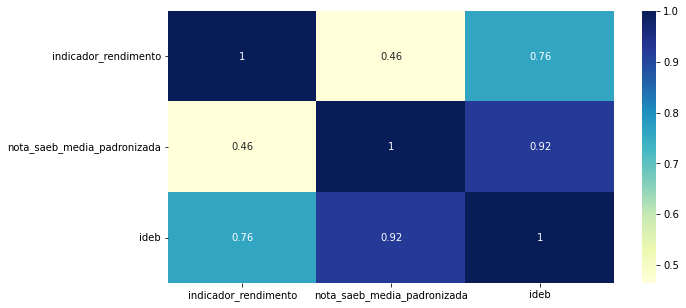

In [38]:
plt.figure(figsize=(10,5)) 
sns.heatmap(df_ideb[['indicador_rendimento', 'nota_saeb_media_padronizada', 'ideb']].corr(), annot=True, cmap='YlGnBu')

plt.show()

### Análise:

A partir do Mapa de Calor, entende-se que a Nota do Saeb não só tem maior correlação com o Índice do Ideb como também tem uma forte correlação positiva (0.92), enquanto o Indicador de Rendimento tem uma correlação menor e considerada média (0.76).

## Quais são os desempenhos por Rede de Ensino de acordo com o Índice do Ideb?

### Preparando os dados:

In [39]:
# Obtendo média do Ideb por escola
escolas_media = df_ideb.groupby(['id_escola']).mean().reset_index() \
                .rename(columns={'ideb': 'media'})[['id_escola', 'media']]
escolas_media.info()
escolas_media.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78802 entries, 0 to 78801
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id_escola  78802 non-null  object 
 1   media      78802 non-null  float64
dtypes: float64(1), object(1)
memory usage: 1.2+ MB


,id_escola,media
0,11000201,5.100000
1,11000252,6.200000
2,11000260,5.473333
3,11000295,5.866667
4,11000317,3.985714


In [40]:
# Mesclando os DF para obter a Rede de Ensino de cada escola
escolas_media_rede = pd.merge(escolas_media, df_ideb[['id_escola', 'rede']].drop_duplicates(), how='left', on='id_escola')
escolas_media_rede.info()
escolas_media_rede.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 78804 entries, 0 to 78803
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id_escola  78804 non-null  object 
 1   media      78804 non-null  float64
 2   rede       78804 non-null  object 
dtypes: float64(1), object(2)
memory usage: 2.4+ MB


,id_escola,media,rede
0,11000201,5.100000,municipal
1,11000252,6.200000,privada
2,11000260,5.473333,estadual
3,11000295,5.866667,estadual
4,11000317,3.985714,estadual


In [41]:
# Novos DFs com as 10.000 escolas com maior desempenho e as 10.000 escolas com menor desempenho baseado na média do índice do Ideb

escolas_media_maior = escolas_media_rede[['rede', 'media']].sort_values(by='media', ascending=False)[:10_000].reset_index(drop=True)
escolas_media_menor = escolas_media_rede[['rede', 'media']].sort_values(by='media')[:10_000].reset_index(drop=True)

escolas_media_maior.info()
print('\n')
escolas_media_menor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   rede    10000 non-null  object 
 1   media   10000 non-null  float64
dtypes: float64(1), object(1)
memory usage: 156.4+ KB


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   rede    10000 non-null  object 
 1   media   10000 non-null  float64
dtypes: float64(1), object(1)
memory usage: 156.4+ KB


In [42]:
# Contagem das maiores e menores notas por Rede de Ensino

# Quantitativo por Rede de Ensino com maiores notas
rede_maior = escolas_media_maior['rede'].value_counts().reset_index().rename(columns={'index': 'rede', 'rede': 'contagem'})

# Quantitativo por Rede de Ensino com menores notas
rede_menor = escolas_media_menor['rede'].value_counts().reset_index().rename(columns={'index': 'rede', 'rede': 'contagem'})

In [43]:
# Percentual por Rede de Ensino das maiores notas
rede_maior['porcentagem'] = (rede_maior['contagem'] / rede_maior['contagem'].sum())
rede_maior

,rede,contagem,porcentagem
0,municipal,7524,0.7524
1,estadual,1929,0.1929
2,privada,435,0.0435
3,federal,112,0.0112


In [44]:
# Percentual por Rede de Ensino das menores notas
rede_menor['porcentagem'] = (rede_menor['contagem'] / rede_menor['contagem'].sum())
rede_menor

,rede,contagem,porcentagem
0,municipal,6179,0.6179
1,estadual,3816,0.3816
2,privada,3,0.0003
3,federal,2,0.0002


In [45]:
# Função para pegar porcentagem de acordo com o tipo de rede
def pega_y(tipo_rede):
    a = round(rede['porcentagem'][rede['rede'] == tipo_rede].values[0]*100, 2)
    b = round(rede_maior['porcentagem'][rede_maior['rede'] == tipo_rede].values[0]*100, 2)
    c = round(rede_menor['porcentagem'][rede_maior['rede'] == tipo_rede].values[0]*100, 2)
    return [a, b, c]  

### Visualização:

In [46]:
analise=['Total', 'Maiores Notas', 'Menores Notas']

fig = go.Figure(data=[
    go.Bar(name='Municipal', x=analise, y=pega_y('municipal'),
            marker_color='#FFD639'),
    
    go.Bar(name='Estadual', x=analise, y=pega_y('estadual'),
            marker_color='#0A014F'),
    
    go.Bar(name='Federal', x=analise, y=pega_y('federal'),
            marker_color='#F05D23'),
    
    go.Bar(name='Privada', x=analise, y=pega_y('privada'),
            marker_color='#00AF54')
    ])

fig.update_layout(
                title_text='Percentual de Redes de Ensino por Tipo de Análise',
                title_font_size=22,
                bargap=0.2,
                width=1000,
                height=800,
                template='gridon'
                )

fig.update_xaxes(title='Tipo de Análise', title_font_size=18)
fig.update_yaxes(title='Porcentagem', title_font_size=18)

fig.show()

In [47]:
fig = go.Figure()

fig.add_trace(go.Box(y=df_ideb[df_ideb['rede'] == 'municipal']['ideb'], name='Municipal',
                marker_color = '#FFD639'))

fig.add_trace(go.Box(y=df_ideb[df_ideb['rede'] == 'estadual']['ideb'], name = 'Estadual',
                marker_color = '#0A014F'))

fig.add_trace(go.Box(y=df_ideb[df_ideb['rede'] == 'federal']['ideb'], name = 'Federal',
                marker_color = '#F05D23'))

fig.add_trace(go.Box(y=df_ideb[df_ideb['rede'] == 'privada']['ideb'], name = 'Privada',
                marker_color = '#00AF54'))

fig.update_layout(
                title_text='Distribuição do Índice por Rede de Ensino',
                title_font_size=22,
                bargap=0.2,
                width=900,
                height=500,
                template='gridon'
                )

fig.update_xaxes(title='Rede de Ensino', title_font_size=18)
fig.update_yaxes(title='Índice Ideb', title_font_size=18)


fig.show()

### Análise:

A rede municipal tem um grande desempenho, já que tem grande porcentagem nas maiores notas e os maiores índices do Ideb comparado com as outras redes (Boxplot).



## 5.2 Eplorando a Base do PBLE

In [48]:
df_pble.head()

,ano,mes,dia,nome_regiao,sigla_uf,nome_uf,id_municipio,nome,rede,id_escola,data
0,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Municipal,RO01032131,2008-12-30
1,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Municipal,11007451,2008-12-30
2,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Estadual,11007885,2008-12-30
3,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Estadual,11007893,2008-12-30
4,2008,12,30,Norte,RO,Rondônia,1100023,Ariquemes,Estadual,11006889,2008-12-30


## Distribuição das Implementações por Rede de Ensino

### Visualização:

In [49]:
rede = df_pble['rede'].value_counts().reset_index().rename(columns={'index': 'rede', 'rede': 'contagem'})

fig = go.Figure(go.Bar(x = rede['rede'],
                       y=ano['contagem'],
                       marker= {'color': np.arange(1,7)[::-1],
                                'colorscale': 'oranges'}
                ))
fig.update_layout(
                title_text='''Implementação por Rede de Ensino''',
                title_font_size=20,
                bargap=0.2,
                width=600,
                height=400,
                template='gridon'
                )

fig.update_xaxes(title='Rede de Ensino', title_font_size=15)
fig.update_yaxes(title='Quantidade', title_font_size=15)

fig.show()

## Distribuição das Implementações por Região

In [50]:
regiao = df_pble['nome_regiao'].value_counts().reset_index().rename(columns={'index': 'nome_regiao', 'nome_regiao': 'contagem'})

fig = go.Figure(go.Bar(x = regiao['nome_regiao'],
                       y=regiao['contagem'],
                       marker= {'color': np.arange(1,10)[::-1],
                                'colorscale': 'oranges'}
                ))
fig.update_layout(
                title_text='''Implementação por Região''',
                title_font_size=20,
                bargap=0.2,
                width=600,
                height=400,
                template='gridon'
                )

fig.update_xaxes(title='Região', title_font_size=15)
fig.update_yaxes(title='Quantidade', title_font_size=15)

fig.show()

## Distribuição das Implementações por Ano

### Visualização:

In [51]:
ano = df_pble['ano'].value_counts().reset_index().rename(columns={'index': 'ano', 'ano': 'contagem'})

fig = go.Figure(go.Bar(x = ano['ano'],
                       y=ano['contagem'],
                       #text=ano['contagem'],
                       marker= {'color': np.arange(1,20)[::-1],
                                'colorscale': 'oranges'}
                ))
fig.update_layout(
                title_text='Implementação por Ano',
                title_font_size=20,
                bargap=0.2,
                width=900,
                height=500,
                template='gridon',
                hoverlabel = dict(bgcolor = "white", font_size = 16),
                )

fig.update_xaxes(title='Ano', title_font_size=15, dtick = 1, tick0 = 0)
fig.update_yaxes(title='Quantidade', title_font_size=15)

fig.show()

### Análise:

Observando as visualizações iniciais de distribuição, infere-se que:

• A implementações por rede de ensino e região têm correlação com os mesmos da base de dados do Ideb;

• Tendo em vista que o Programa Banda Larga nas Escolas começou em 2007, a tendência é haver um decréscimo de instalações por ano, levando em consideração que, com o passar do tempo, a necessidade de novas instalações é menor.

## Quais é o quantitativo cumulativo de Implementações ao Longo dos anos?

In [52]:
# Agrupando por ano e fazendo soma cumulativa
df_pble_cum = df_pble.groupby(['ano']).count().reset_index()[['ano', 'id_escola']].rename(columns={'id_escola': 'qtde_instalacao'})
df_pble_cum['qtde_instalacao'] = df_pble_cum['qtde_instalacao'].cumsum()

In [53]:
fig = px.line(df_pble_cum, x='ano', y='qtde_instalacao',
             width=600, height=300)
fig.update_traces(line_color='#F05D23')
fig.update_layout(
                title_text='Instalações Cumulativas ao Longo dos Anos',
                title_font_size=20,
                bargap=0.2,
                width=600,
                height=400,
                template='gridon'
                )
fig.update_yaxes(title='Implementações')
fig.update_xaxes(title='Ano')
fig.show()

### Análise:

Observando a linha ao longo do tempo, apesar de haver somente linhas crescentes, ela tendem cada vez mais ao inclinamento, o que dá a entender que as implementações estão tendendo a zero.

## 5.3 Cruzamento de Dados

## Quanto maior acesso a internet, maior o desempenho?

In [54]:
df_pble_cum.head()

,ano,qtde_instalacao
0,2008,20746
1,2009,40776
2,2010,51217
3,2011,55367
4,2012,58667


In [55]:
# Agrupando por 'ano', calculando a média
df_ideb_media = df_ideb.groupby(['ano']).mean().reset_index()[['ano', 'ideb']].rename(columns={'ideb': 'media_ideb'})
df_ideb_media.head()

,ano,media_ideb
0,2007,3.820746
1,2009,4.069085
2,2011,4.327105
3,2013,4.448662
4,2015,4.772108


In [56]:
# Merge: PBLE - Ideb
df_pble_ideb = pd.merge(df_pble_cum, df_ideb_media, how='left', on='ano')
df_pble_ideb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12 entries, 0 to 11
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ano              12 non-null     int64  
 1   qtde_instalacao  12 non-null     int64  
 2   media_ideb       6 non-null      float64
dtypes: float64(1), int64(2)
memory usage: 384.0 bytes


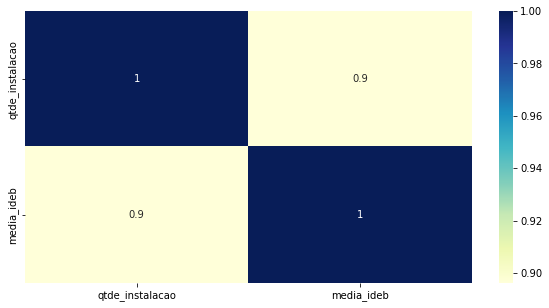

In [57]:
plt.figure(figsize=(10,5)) 
sns.heatmap(df_pble_ideb[['qtde_instalacao', 'media_ideb']].corr(), annot=True, cmap='YlGnBu')

plt.show()

### Análise:

Quanto mais informação, maior o rendimento escolar sim. A partir da forte correlação positiva (0.9) do Índice Ideb com a quantidade Cumulativa de Implementações de Banda Larga nas Escolas, conclui-se a importância do acesso a informação para desenvolvimento da educação.